In [ ]:
import numpy as np
import pandas as pd
import pickle
from collections import Counter
from multiprocessing.pool import Pool
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
import seaborn as sns
import matplotlib.pyplot as plt


#df = pd.read_csv('Phishing_Email.csv')
df = pd.read_parquet('https://data434.s3.us-east-2.amazonaws.com/Phishing_Email.parquet')
tokens = df['Email Text'].str.split()
tokens.head()

,Email Text
0,"[re, :, 6, ., 1100, ,, disc, :, uniformitarian..."
1,"[the, other, side, of, *, galicismos, *, *, ga..."
2,"[re, :, equistar, deal, tickets, are, you, sti..."
3,"[Hello, I, am, your, hot, lil, horny, toy., I,..."
4,"[software, at, incredibly, low, prices, (, 86,..."



I cleaned the data by removing stop words (like "and," "the," punctuation, and numbers) and then one-hot-encoded the tokens for each email as features. I used these token features to predict whether emails were scams, focusing on PCA and linear models since that’s the main focus of the assignment.

In [7]:
from google.colab import files
files.upload()

Saving all_tokens (1).pickle to all_tokens (1).pickle


{'all_tokens (1).pickle': b'\x80\x04\x95\x06\x00\x01\x00\x00\x00\x00\x00]\x94(\x8c\x041100\x94\x8c\x04disc\x94\x8c\x11uniformitarianism\x94\x8c\x041086\x94\x8c\x03sex\x94\x8c\x04lang\x94\x8c\x04dick\x94\x8c\x06hudson\x94\x8c\x0cobservations\x94\x8c\x03use\x94\x8c\x04side\x94\x8c\ngalicismos\x94\x8c\tgalicismo\x94\x8c\x07spanish\x94\x8c\x04term\x94\x8c\x05names\x94\x8c\x08improper\x94\x8c\x0cintroduction\x94\x8c\x06french\x94\x8c\x05words\x94\x8c\x07spanish\x94\x8c\x08sounding\x94\x8c\x04thus\x94\x8c\tdeceptive\x94\x8c\x08equistar\x94\x8c\x04deal\x94\x8c\x07tickets\x94\x8c\x05still\x94\x8c\tavailable\x94\x8c\x06assist\x94\x8c\x06robert\x94\x8c\x08entering\x94\x8c\x03new\x94\x8c\x04deal\x94\x8c\x07tickets\x94\x8c\x08equistar\x94\x8c\x07talking\x94\x8c\x05bryan\x94\x8c\x04hull\x94\x8c\x05anita\x94\x8c\x05luong\x94\x8c\x04kyle\x94\x8c\x05hello\x94\x8c\x03hot\x94\x8c\x03lil\x94\x8c\x05horny\x94\x8c\x04toy.\x94\x8c\x03one\x94\x8c\x05dream\x94\x8c\x06about,\x94\x8c\x04open\x94\x8c\x06minded\x

<Axes: >

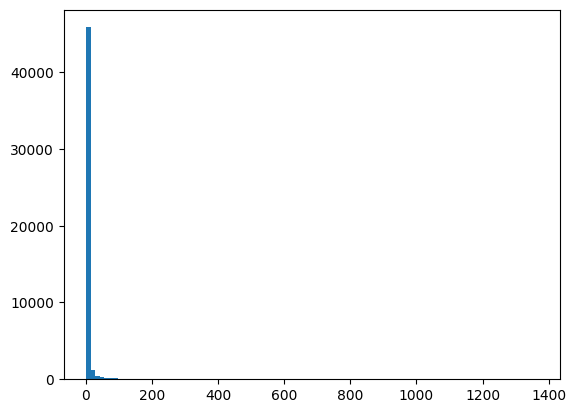

In [11]:
with open('all_tokens (1).pickle', 'rb') as file:
    all_tokens = pickle.load(file)

from collections import Counter
token_count = Counter(all_tokens)
token_freq = token_count.most_common()

gdf = pd.DataFrame(token_freq,columns=['token','count'])
gdf['count'].hist(grid=False,bins=100)

I combined all the emails into one big vector, removed punctuation and common words like "the." Run the code below to load it and use the Counter class to check out the most common words.

In [12]:
gdf['count'].describe()

,count
count,48691.000000
mean,5.687889
std,27.717476
min,1.000000
25%,1.000000
50%,1.000000
75%,2.000000
max,1365.000000


Most tokens show up only once, and only a few appear more than 10 times. Even at the 75th percentile, tokens appear just twice, but the most common token shows up 1,365 times. This is tricky because rare tokens aren’t great for predicting scams, and super common ones like "the" or "and" aren’t helpful either.

In [13]:
files.upload()

Saving Phishing_clean.parquet to Phishing_clean.parquet


{'Phishing_clean.parquet': b'PAR1\x15\x04\x15 \x15$L\x15\x04\x15\x00\x12\x00\x00\x10<\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x15\x00\x15\xf4%\x15\xfe%,\x15\x94\xa3\x02\x15\x10\x15\x06\x15\x06\x1c\x18\x08\x01\x00\x00\x00\x00\x00\x00\x00\x18\x08\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00(\x08\x01\x00\x00\x00\x00\x00\x00\x00\x18\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\x12\xf4y\t\x04\x00\x00\x00\x94\xa3\x02\x01\x01%\x98\x05`\x90\x94\x93\xa5\x1a\x16\xc8\x03\xb2\xedU\x98\xd0~\'\x10\x00Q\xa9@L\x06`\x14D`t\x88\xc6*\xc2:/\x0f\xce\x1cu\xa7\xbd|J\x8f@P\xb0\xe4v4\xc7m\x02\xa0\x14r\xc5\x97q"\x10\x00\x19C\x18\xe4\xf9G\x90\x92\xd1\xa6H\x01\n\x16\x00\x7f-#\xa6\xc8hD\x1b\x80_\x93"F\xa0b\xc4\r0\xc8\xe9\xe9\x8cE \x18\x9b\xe2*\xcf\x16P\xc3\x82\xd0&J\x03\xd5\n\xca\xb0\x15\xc3\xd5\x15R6\x89c\xde"\x8c(tH\x98\xe5\xc0\x18\x88S68\xc4\x19b>\xa1\xc7\xea\xd0\xf4,\nR!\x83\x10\x00\x7f\x01+\x8b\x8d/3\xec)\xb8\xa1\xb10j\xdeOO\x89U\x1c\x88\xaa\ty\x8a&\xa1\xeb<`\xc5\x05vH\nS\x83\xd2Q\x0

In [16]:
df = pd.read_parquet('Phishing_clean.parquet')


y = df['Email Type']
X = df.drop('Email Type',axis=1)

## 1.
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2, random_state=125)

## 2.
lm_0 = LinearRegression(fit_intercept=False).fit(X_train,y_train)
y_hat_test_0 = lm_0.predict(X_test)
y_hat_train_0 = lm_0.predict(X_train)
print('train: ', r2_score(y_hat_train_0,y_train) )
print('test: ', r2_score(y_hat_test_0,y_test) )

train:  0.6210107280960204
test:  -0.00026838432670373


In [17]:

rdf = pd.DataFrame({'variable':lm_0.feature_names_in_ , 'value':lm_0.coef_})
rdf['abs'] = np.abs(rdf['value'])
rdf.sort_values('abs',ascending=False)

,variable,value,abs
710,1997,-1.415784e+13,1.415784e+13
421,1995,1.158467e+13,1.158467e+13
1133,"19,",-1.025713e+13,1.025713e+13
340,2005,-9.773947e+12,9.773947e+12
1146,-0400,-8.062341e+12,8.062341e+12
...,...,...,...
1399,union,2.822876e-04,2.822876e-04
565,east,-2.746582e-04,2.746582e-04
2268,ravages,-1.068115e-04,1.068115e-04
457,due,-6.484985e-05,6.484985e-05



The top variables are just numbers, which isn’t super helpful for spotting scams. But it does highlight the advantage of using PCA. The model performs well on the training set (R² = 0.62), but on the test set, it’s barely better than predicting the mean. Looks like it’s overfitting—no surprise with 2,611 features that are likely highly correlated.

<Axes: >

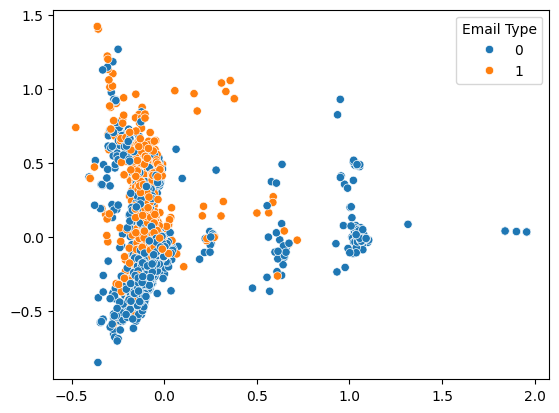

In [18]:
reduction = PCA(n_components=2).fit(X_train)
Z_train = reduction.transform(X_train)
Z_test = reduction.transform(X_test)
sns.scatterplot(x=Z_test[:,0],y=Z_test[:,1],hue=y_test)


The orange dots represent scams. They usually have a high second component and a low first component. Our goal is to use the model to separate the orange dots from the blue ones.

In [19]:
reduction = PCA(n_components=2610).fit(X_train)
Z_train = reduction.transform(X_train)
Z_test = reduction.transform(X_test)

lm_k = LinearRegression().fit(Z_train,y_train)
y_hat_test = lm_k.predict(Z_test)
y_hat_train = lm_k.predict(Z_train)

print('Train r2: ', r2_score(y_hat_train,y_train) )
print('Test r2: ', r2_score(y_hat_test,y_test) )

Train r2:  0.692897536096375
Test r2:  0.5873905973217184



This performs much better than the basic linear regression: an
𝑅
2
R
2
  of 0.587 compared to basically 0 for the simple model. It’s also much closer to the training
𝑅
2
R
2
  of 0.692.

With PCA, the features are made independent (orthogonal), so multicollinearity isn’t an issue. It’s also easier to decide how many components to include—1, 2, or up to 2,711—instead of dealing with \( 2^{2711} \) possible combinations of features. However, while we can interpret individual words, the components themselves are harder to understand.